Importamos las librerias necesarias y las dos imágenes principales

In [64]:
from PIL import Image
import matplotlib as plt
filename = "/content/drive/MyDrive/Colab Notebooks/Procesamiento_y_Clasificacion_de_Datos/Tarea_5/origen.jpg"
filenam2 = "/content/drive/MyDrive/Colab Notebooks/Procesamiento_y_Clasificacion_de_Datos/Tarea_5/mike.jpg"
with Image.open(filename) as img:
    img.load()
with Image.open(filenam2) as mike:
    mike.load()


type(img)

isinstance(img, Image.Image)

True

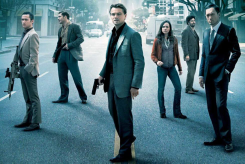

In [2]:
img.reduce(4)

Mi imagen en la macroplaza viene rotada y con mucho espacio, por lo que se trabajará con ella

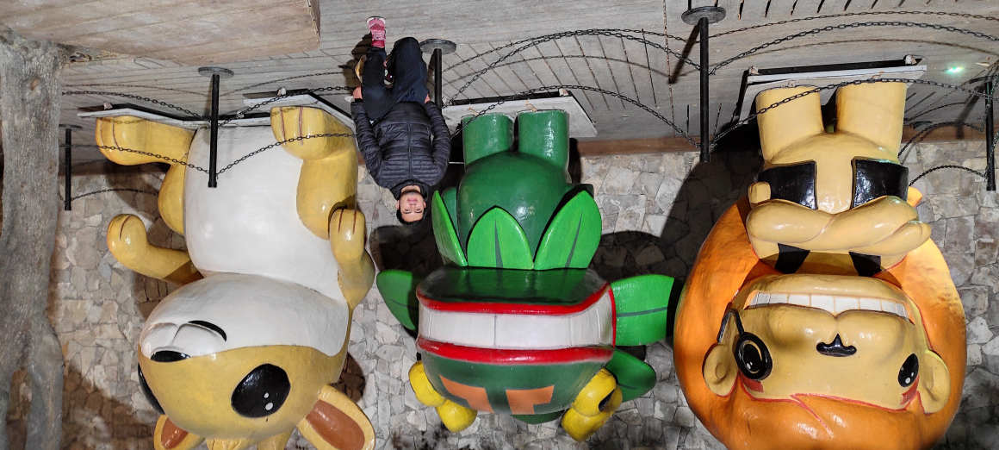

In [3]:
mike.reduce(4)

In [4]:
print(img.format)
print(img.size)
print(img.mode)

JPEG
(980, 653)
RGB


In [5]:
print(mike.format)
print(mike.size)
print(mike.mode)

JPEG
(4640, 2088)
RGB


Después de varios intentos, identifico la parte en la que solo aparezco yo y la recorto.

In [6]:
cropped_mike = mike.crop((1600, 50, 2100, 1100))
cropped_mike.size
#cropped_img.show()

(500, 1050)

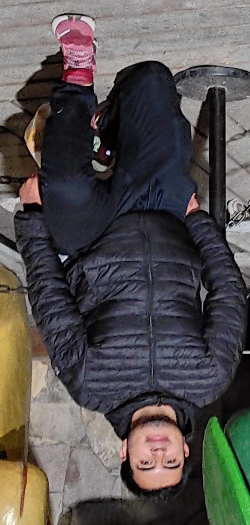

In [7]:
cropped_mike.reduce(2)

La rotamos 180 grados para que quede en la forma correcta

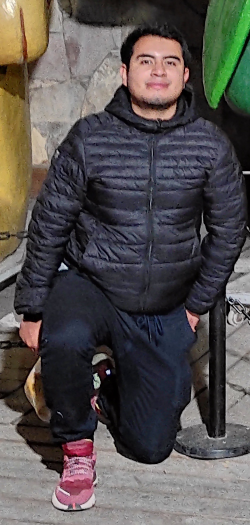

In [8]:
cropped_mike = cropped_mike.transpose(Image.FLIP_TOP_BOTTOM)
#converted_img.show()
cropped_mike.reduce(2)

In [9]:
cropped_mike.save('/content/drive/MyDrive/Colab Notebooks/Procesamiento_y_Clasificacion_de_Datos/Tarea_5/crooped_mike.jpg')

## Rotaciones

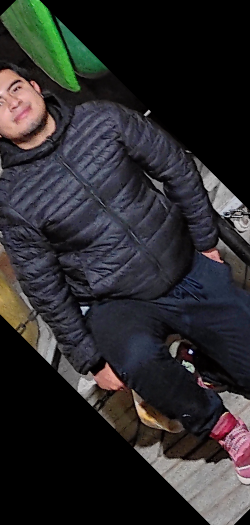

In [10]:
rotated_img = cropped_mike.rotate(45)
rotated_img.reduce(2)

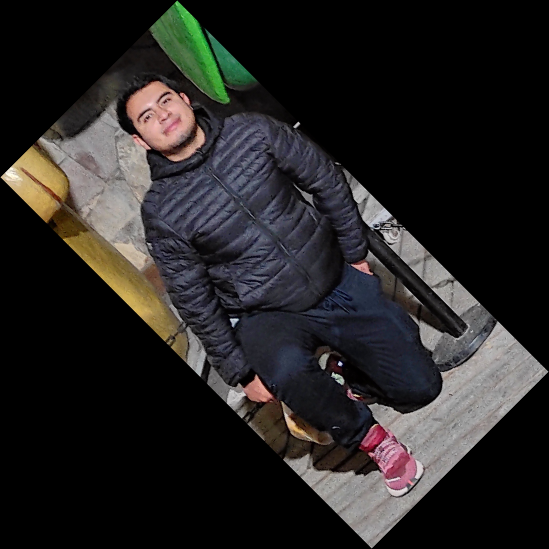

In [11]:
rotated_img = cropped_mike.rotate(45, expand=True)
rotated_img.reduce(2)

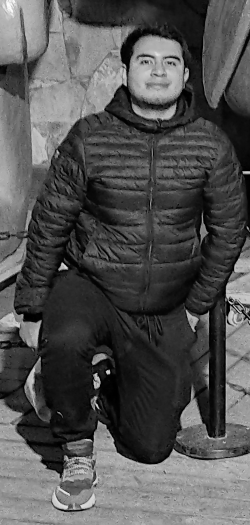

In [12]:
cmyk_img = cropped_mike.convert("CMYK")
gray_img = cropped_mike.convert("L")  # Grayscale

gray_img.reduce(2)

In [13]:
print(img.getbands())
print(cmyk_img.getbands())
print(gray_img.getbands())

('R', 'G', 'B')
('C', 'M', 'Y', 'K')
('L',)


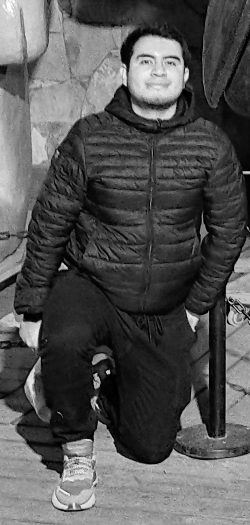

In [14]:
red, green, blue = cropped_mike.split()
red.reduce(2)

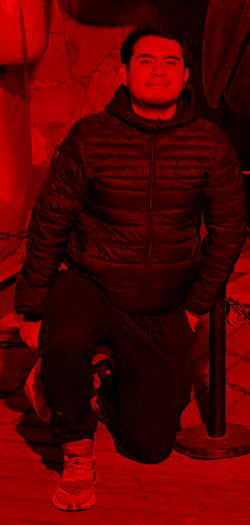

In [15]:
zeroed_band = red.point(lambda _: 0)

red_merge = Image.merge("RGB", (red, zeroed_band, zeroed_band))
green_merge = Image.merge("RGB", (zeroed_band, green, zeroed_band))
blue_merge = Image.merge( "RGB", (zeroed_band, zeroed_band, blue))

red_merge.reduce(2)

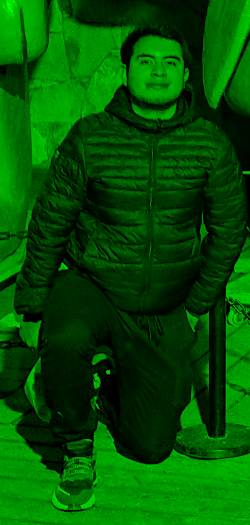

In [16]:
green_merge.reduce(2)

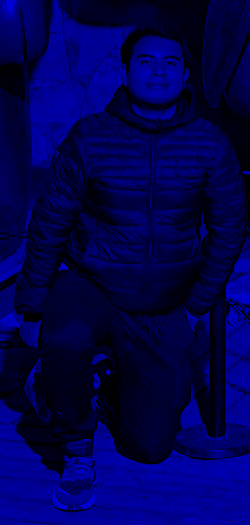

In [17]:
blue_merge.reduce(2)

In [18]:
from PIL import Image, ImageFilter

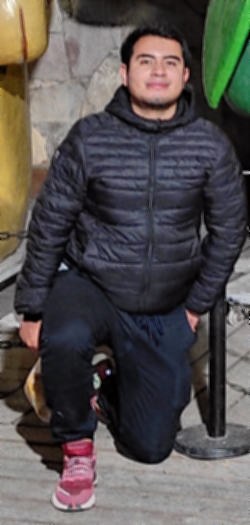

In [19]:
blur_img = cropped_mike.filter(ImageFilter.BLUR)
blur_img.reduce(2)

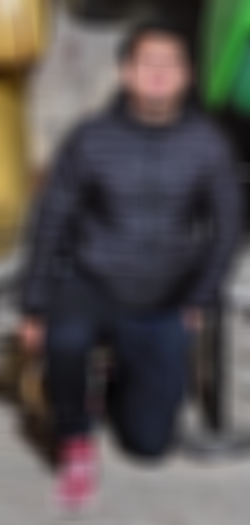

In [20]:
cropped_mike.filter(ImageFilter.BoxBlur(20)).reduce(2)

## Blurring, sharpening


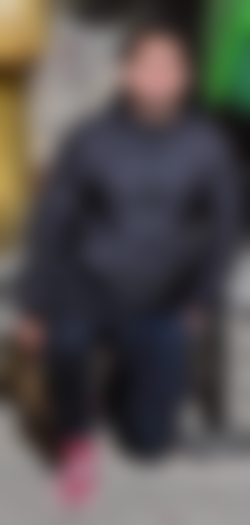

In [21]:
cropped_mike.filter(ImageFilter.GaussianBlur(20)).reduce(2)

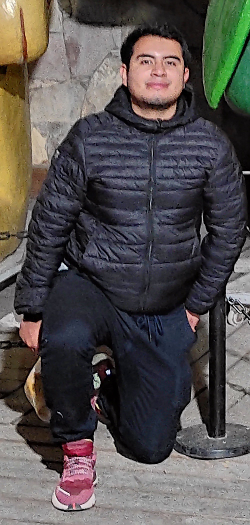

In [22]:
cropped_mike.filter(ImageFilter.SHARPEN).reduce(2)

## Smoothing

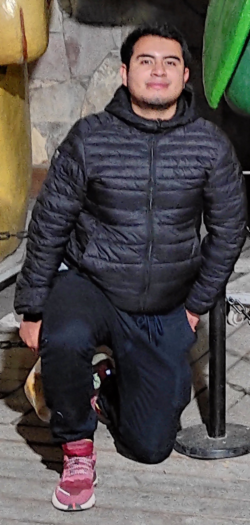

In [23]:
 cropped_mike.filter(ImageFilter.SMOOTH).reduce(2)

## Deteccion de bordes, mejora de bordes y embossing.

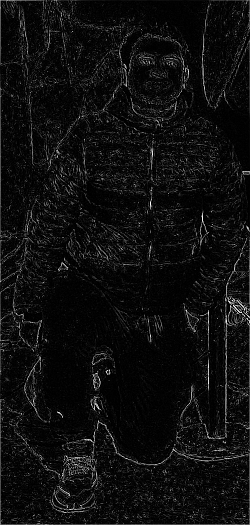

In [24]:
img_gray = cropped_mike.convert("L")
edges = img_gray.filter(ImageFilter.FIND_EDGES)
edges.reduce(2)

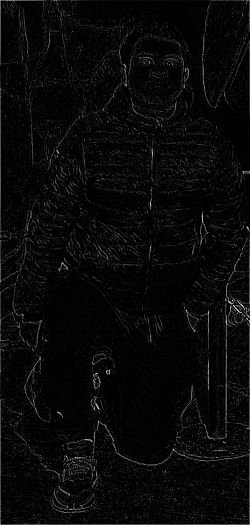

In [25]:
img_gray_smooth = img_gray.filter(ImageFilter.SMOOTH)
edges_smooth = img_gray_smooth.filter(ImageFilter.FIND_EDGES)
edges_smooth.reduce(2)

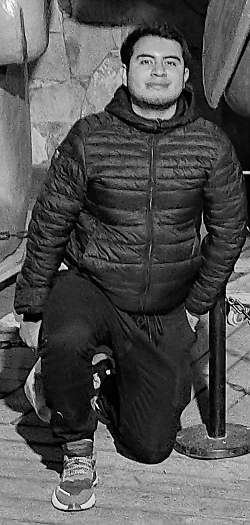

In [26]:
edge_enhance = img_gray_smooth.filter(ImageFilter.EDGE_ENHANCE)
edge_enhance.reduce(2)

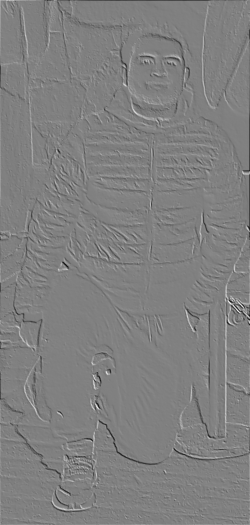

In [27]:
emboss = img_gray_smooth.filter(ImageFilter.EMBOSS)
emboss.reduce(2)

In [28]:
from PIL import ImageOps

Como en mi ropa hay mayor presencia de color oscuros invertimos los colores para que sea más sencillo para el threshold poder identificar las regiones deseadas

In [29]:
img_gray=ImageOps.invert(img_gray)

Agregamos una restricción adicional en el threshold para limitarlo tanto de manera inferior como superior

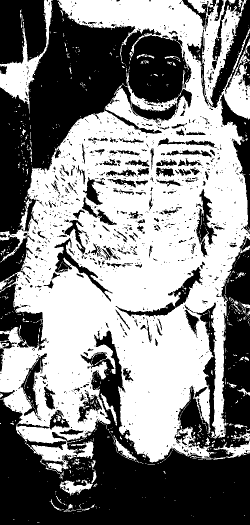

In [30]:
threshold = 160
img_mike_threshold = img_gray.point(
    lambda x: 255 if x > threshold and x<240 else 0
)
img_mike_threshold.reduce(2)

decidimos solo aplicar un ciclo de Erosión ya que con varios ciclos tomaba partes que no eran convenientes

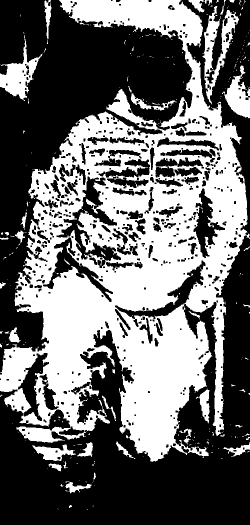

In [31]:
def erode(cycles, image):
    for _ in range(cycles):
         image = image.filter(ImageFilter.MinFilter(3))
    return image


def dilate(cycles, image):
    for _ in range(cycles):
         image = image.filter(ImageFilter.MaxFilter(3))
    return image
    
step_1 = erode(1, img_mike_threshold)
step_1.reduce(2)

De igual manera para la dilatación, solo se aplicó un ciclo

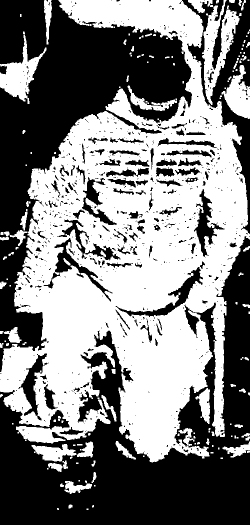

In [32]:
step_2 = dilate(1, step_1)
step_2.reduce(2)

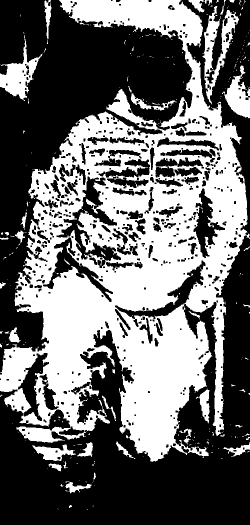

In [33]:
cat_mask = erode(1, step_2)
cat_mask.reduce(2)

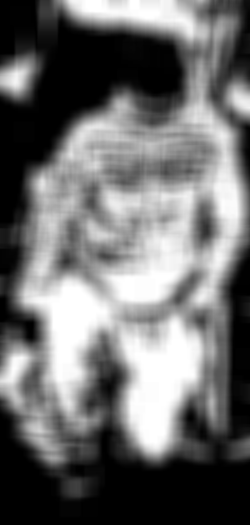

In [34]:
cat_mask = cat_mask.convert("L")
cat_mask = cat_mask.filter(ImageFilter.BoxBlur(20))
cat_mask.reduce(2)

Al final tenemos esta imagen, en la que no logramos obtener mi cara, y esto debido a que el threshold de mi cara y el de ropa son totalmente diferente, para poder atrapar ambos practicamente necesitamos dejar sin filtro el threshold lo que nos regresa la misma imagen

Intentaremos trabajar con esta imagen pero es probable que no obtengamos los resultados deseados

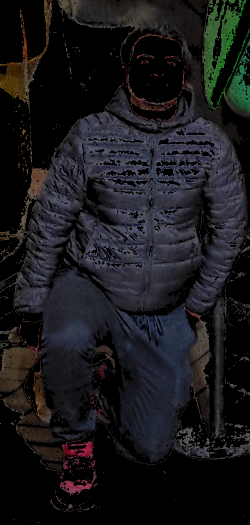

In [35]:
blank = cropped_mike.point(lambda _: 0)
mike_segmented = Image.composite(cropped_mike, blank, img_mike_threshold)
mike_segmented.reduce(2)

In [36]:
img.size

(980, 653)

In [65]:
img_2=img.copy()

Intentaremos agregar mi imagen trabajada en la imagen del origen para hacerme pasar por uno más de los personajes del elenco

## Resultados finales parte 1

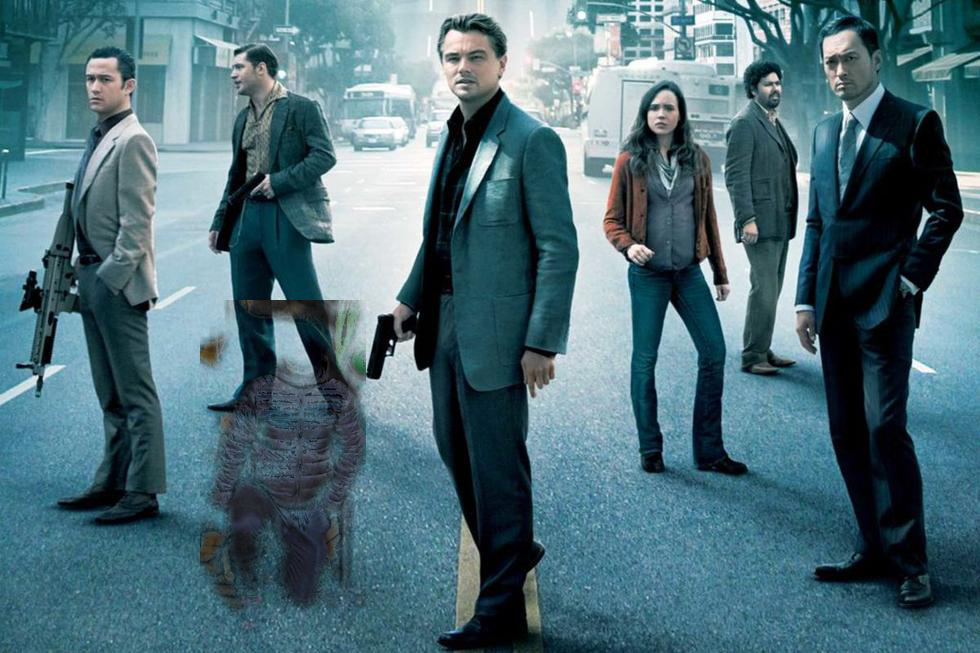

In [66]:
img.paste(
    mike_segmented.resize((mike_segmented.width // 3, mike_segmented.height // 3)),
    (200, 300),
    cat_mask.resize((cat_mask.width // 3, cat_mask.height // 3)),
)
img

Claramente los resultados no son para nada los esperados, trabajaremos con otra imagen que no tenga un contraste tan alto que nos haga tomar todo el rango en el threshold

## Canguro Albino

In [39]:
with Image.open('/content/drive/MyDrive/Colab Notebooks/Procesamiento_y_Clasificacion_de_Datos/Tarea_5/canguro-albino.jpg') as canguro:
    canguro.load()

Tomamos esta imagen de un canguro albino, ya que solo posee colores claros y hará mucho más facil para el threshold detectar la parte que queremos

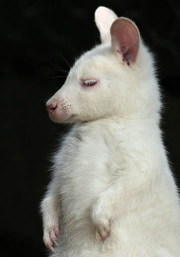

In [40]:
canguro.reduce(2)

In [41]:
img_canguro_gray = canguro.convert("L")

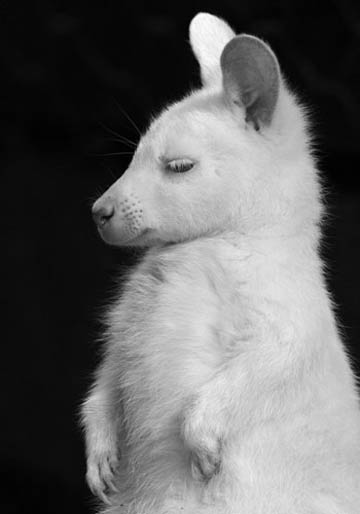

In [42]:
img_canguro_gray


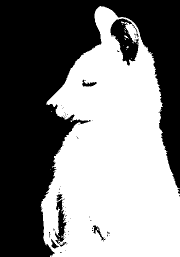

In [43]:
threshold = 100
img_canguro_threshold = img_canguro_gray.point(
    lambda x: 255 if x > threshold else 0
)
img_canguro_threshold.reduce(2)

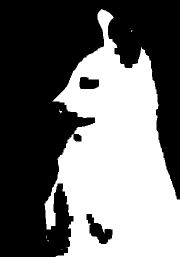

In [44]:
step_1 = erode(5, img_canguro_threshold)
step_1.reduce(2)

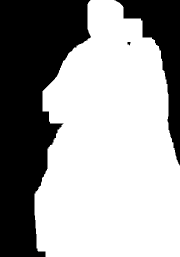

In [45]:
step_2 = dilate(20, step_1)
step_2.reduce(2)

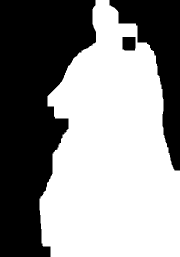

In [46]:
canguro_mask = erode(10, step_2)
canguro_mask.reduce(2)

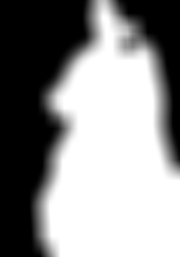

In [47]:
canguro_mask = canguro_mask.convert("L")
canguro_mask = canguro_mask.filter(ImageFilter.BoxBlur(20))
canguro_mask.reduce(2)

Como resultado final tenemos una imagen perfectamente recortada del canguro

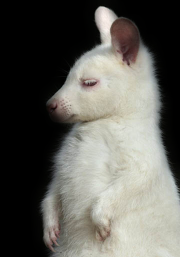

In [48]:
blank = canguro.point(lambda _: 0)
canguro_segmented = Image.composite(canguro, blank, canguro_mask)
canguro_segmented.reduce(2)

In [75]:
img=img_2.copy()

In [50]:
img.size

(980, 653)

In [55]:
canguro_segmented.size

(360, 514)

Ahora agregaremos el canguro junto al elenco del Origen

## Resultados finales parte 2

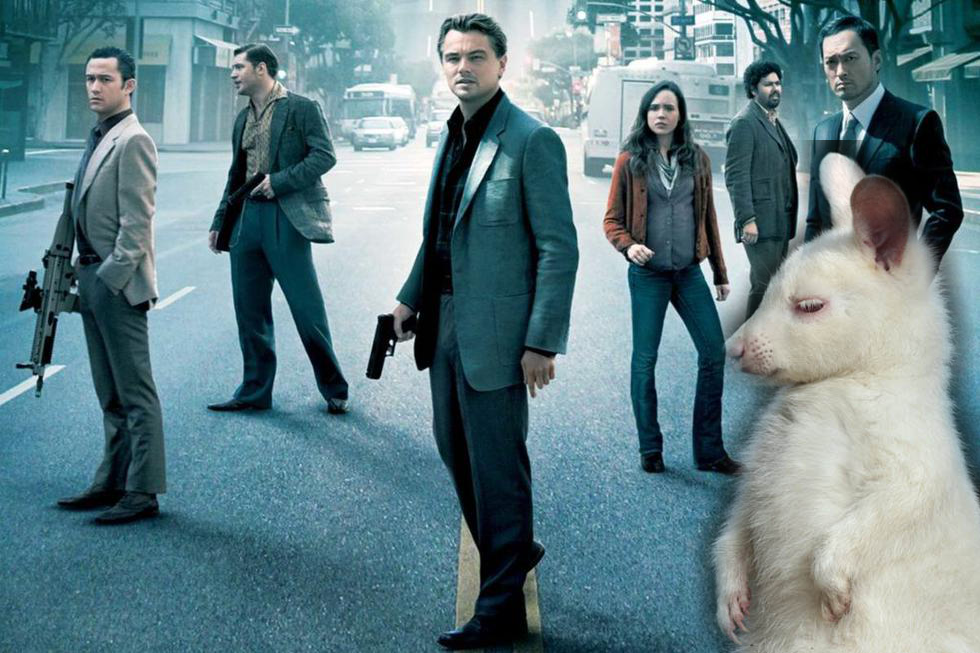

In [76]:
img.paste(
    canguro.resize((canguro.width * 1, canguro.height * 1)),
    (630, 140),
    canguro_mask.resize((canguro_mask.width * 1, canguro_mask.height *1)),
)
img

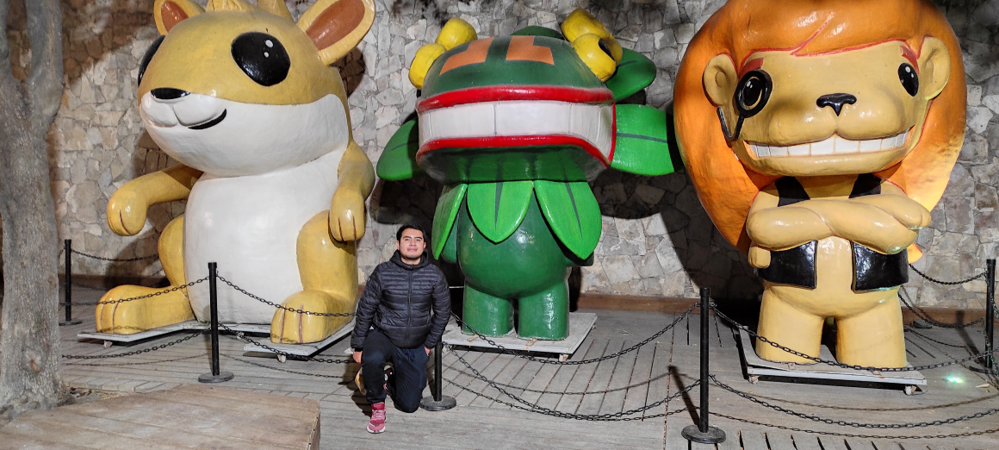

In [77]:
mike = mike.transpose(Image.FLIP_TOP_BOTTOM)
#converted_img.show()
mike.reduce(4)

In [78]:
mike2=mike.copy()

In [98]:
mike=mike2.copy()

Ahora agregaremos el canguro en mi foto en la macroplaza

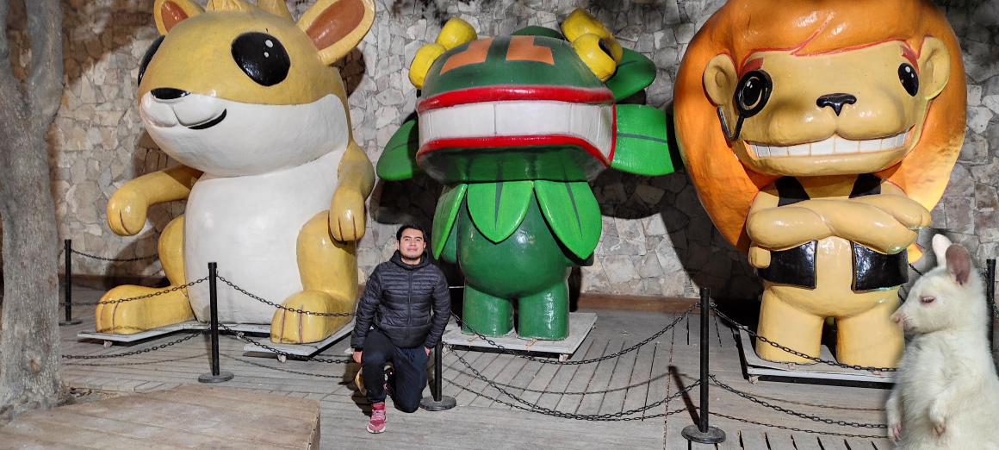

In [99]:
mike.paste(
    canguro.resize((canguro.width * 2, canguro.height * 2)),
    (3950, 1060),
    canguro_mask.resize((canguro_mask.width * 2, canguro_mask.height *2)),
)
mike.reduce(4)

Decidimos jugar un poco con la función copy y nos pusimos creativos

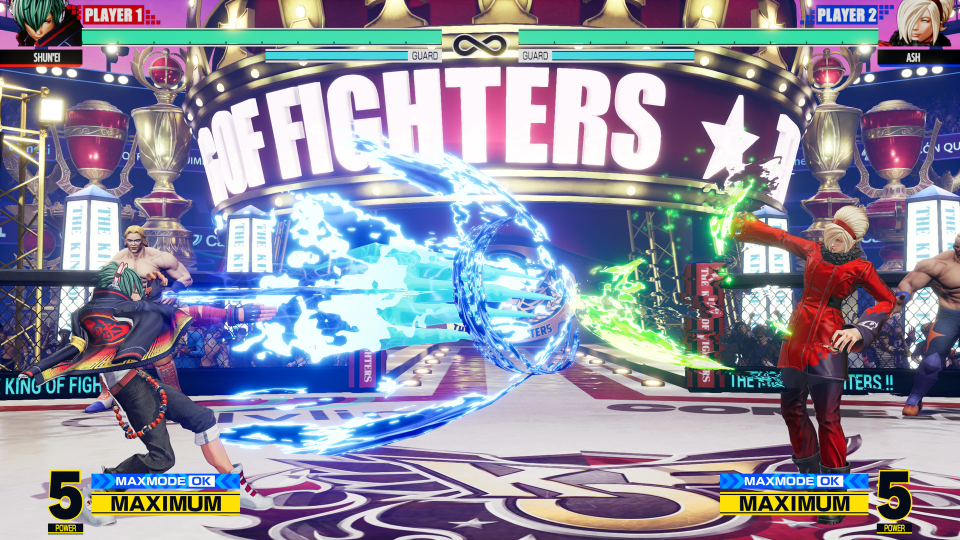

In [101]:
with Image.open('/content/drive/MyDrive/Colab Notebooks/Procesamiento_y_Clasificacion_de_Datos/Tarea_5/kof.jpg') as kof:
    kof.load()
kof.reduce(2)

In [103]:
kof2=kof.copy()

In [152]:
kof=kof2.copy()

Recortamos la cabeza del canguro para poder agregar en el lado superior derecho

In [134]:
canguro_head=canguro.crop((80, 0, 360, 270))

In [153]:
kof.paste(
    canguro_head.resize((canguro_head.width //2 , canguro_head.height // 2)),
    (1760, 0)
)


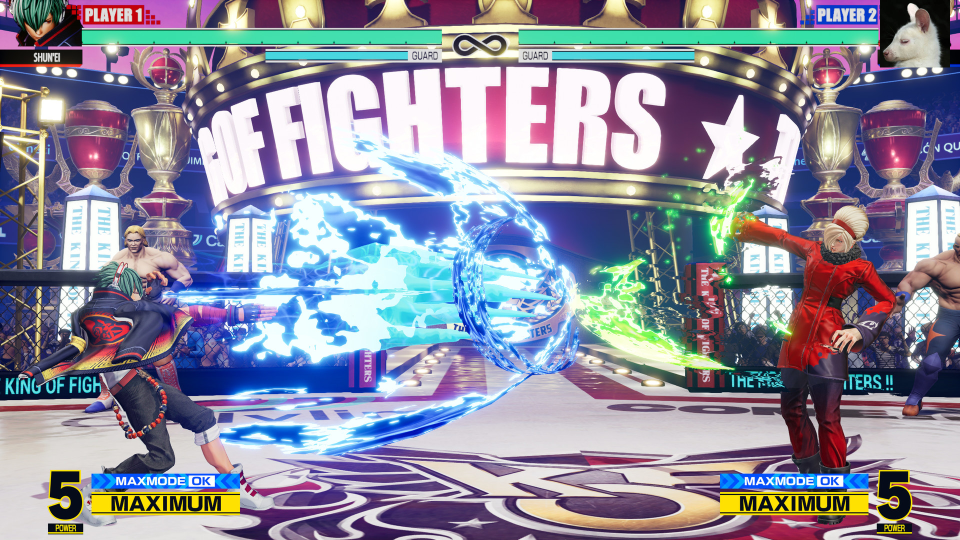

In [154]:
kof.reduce(2)

Agregamos 9 veces la imagen del canguro para dar el efecto de movimiento

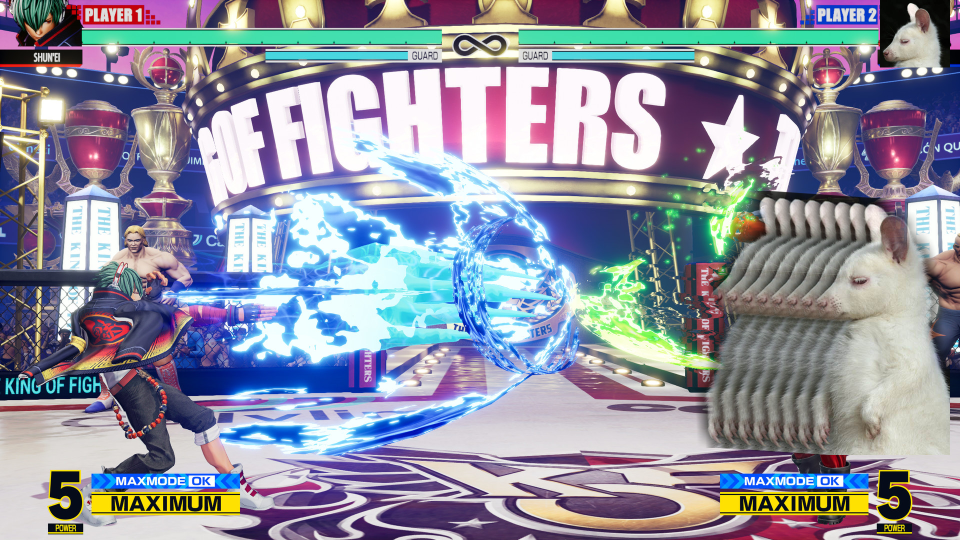

In [155]:
for i in range(1,9):
  kof.paste(
      canguro.resize((canguro.width, canguro.height)),
      (1300+i*30, 380+i*2),
      canguro_mask.resize((canguro_mask.width , canguro_mask.height)),
  )
kof.reduce(2)

Sin duda quedo fenomenal la pelea entre el canguro y Shun

Conclusiones:

Existe un gran abanico de posibilidades que nos permiten manipular las imágenes a nuestra conveniencia, sin embargo, se necesita un conocimiento previo y tiempo disponible, para poder manipular las imágenes y lograr los resultados deseados. 
Realizar el recorte a gusto de una imagen resulta bastante laborioso utilizando solo la selección de áreas mediante la elección de umbrales, sobre todo cuando se tiene una imagen con un rango muy amplio en la escala de grises, se recomienda utilizar otras técnica o incluso un recorte utilizando las cortenadas del área de interés.